## Setup
<a id="setup"></a>

In [1]:
%load_ext autoreload
%autoreload 2

### Config
<a id="setup_config"></a>

In [2]:
import assignment.config as config

config.list_available()

Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_7/assignment/config.yaml


['lfw_trinet',
 'lfw_trinet_pretrained',
 'lfw_trinet_pretrained_shnmining',
 'lfw_unnormalized']

### Modules
<a id="setup_modules"></a>

In [3]:
from pathlib import Path

import numpy as np
import torch
import torchinfo
import torchvision as tv

import assignment.scripts.init_exp as init_exp
import assignment.scripts.compute_mean_and_std as compute_mean_and_std
from assignment.evaluation.evaluator import Evaluator
from assignment.training.trainer import Trainer
import assignment.libs.factory as factory
import assignment.libs.utils_checkpoints as utils_checkpoints
import assignment.libs.utils_data as utils_data
import assignment.libs.utils_model as utils_model
import assignment.visualization.plot as plot
import assignment.visualization.visualize as visualize

### Paths and names
<a id="setup_paths_and_names"></a>

In [4]:
name_exp_lfw_unnormalized = "lfw_unnormalized"
name_exp_lfw_trinet = "lfw_trinet"
name_exp_lfw_trinet_pretrained = "lfw_trinet_pretrained"
name_exp_lfw_trinet_pretrained_shnmining = "lfw_trinet_pretrained_shnmining"

path_dir_exp_lfw_trinet = Path(config._PATH_DIR_EXPS) / name_exp_lfw_trinet
path_dir_exp_lfw_trinet_pretrained = Path(config._PATH_DIR_EXPS) / name_exp_lfw_trinet_pretrained
path_dir_exp_lfw_trinet_pretrained_shnmining = Path(config._PATH_DIR_EXPS) / name_exp_lfw_trinet_pretrained_shnmining

## Initialization

In [13]:
init_exp.init_exp(name_exp=name_exp_lfw_trinet, name_config=name_exp_lfw_trinet, use_remove_old=False)

Initializing experiment lfw_trinet...
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet/checkpoints
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet/logs
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet/tensorboard
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet/plots
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet/visualizations
Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_7/assignment/configs/lfw_trinet.yaml
Config saved to /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet/config.yaml
Initializing experiment lfw_trinet finished


In [29]:
init_exp.init_exp(name_exp=name_exp_lfw_trinet_pretrained, name_config=name_exp_lfw_trinet_pretrained, use_remove_old=False)

Initializing experiment lfw_trinet_pretrained...
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet_pretrained
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet_pretrained/checkpoints
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet_pretrained/logs
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet_pretrained/tensorboard
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet_pretrained/plots
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet_pretrained/visualizations
Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_7/assignment/configs/lfw_trinet_pretrained.yaml
Config saved to /home/user/karacora/lab-vision-systems-assignments/assignmen

In [8]:
init_exp.init_exp(name_exp=name_exp_lfw_trinet_pretrained_shnmining, name_config=name_exp_lfw_trinet_pretrained_shnmining, use_remove_old=False)

Initializing experiment lfw_trinet_pretrained_shnmining...
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet_pretrained_shnmining
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet_pretrained_shnmining/checkpoints
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet_pretrained_shnmining/logs
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet_pretrained_shnmining/tensorboard
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet_pretrained_shnmining/plots
Created directory /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet_pretrained_shnmining/visualizations
Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_7/assignment/configs/lfw_trinet_pretrained_shnmining.y

## Data

### LFW

In [19]:
compute_mean_and_std.compute_mean_and_std(name_config=name_exp_lfw_unnormalized, split="training")

Computing mean and standard deviation ...
Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_7/assignment/configs/lfw_unnormalized.yaml
Files already downloaded and verified
Dataset
Dataset LFWPeople
    Number of samples: 9525
    Path: /home/user/karacora/lab-vision-systems-assignments/assignment_7/data/lfwpeople
    Split: training
    Transform of samples: Compose(
      PILToTensor()
      Resize(size=[256, 256], interpolation=InterpolationMode.BILINEAR, antialias=True)
      CenterCrop(size=[224, 224])
      ToDtype(
    scale=True
    (transform_tv): ToDtype(scale=True)
  )
)
    Transform of targets: None
Mean: tensor([0.4614, 0.3953, 0.3480])
Standard deviation: tensor([0.2861, 0.2614, 0.2568])
Computing mean and standard deviation finished


Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet/config.yaml


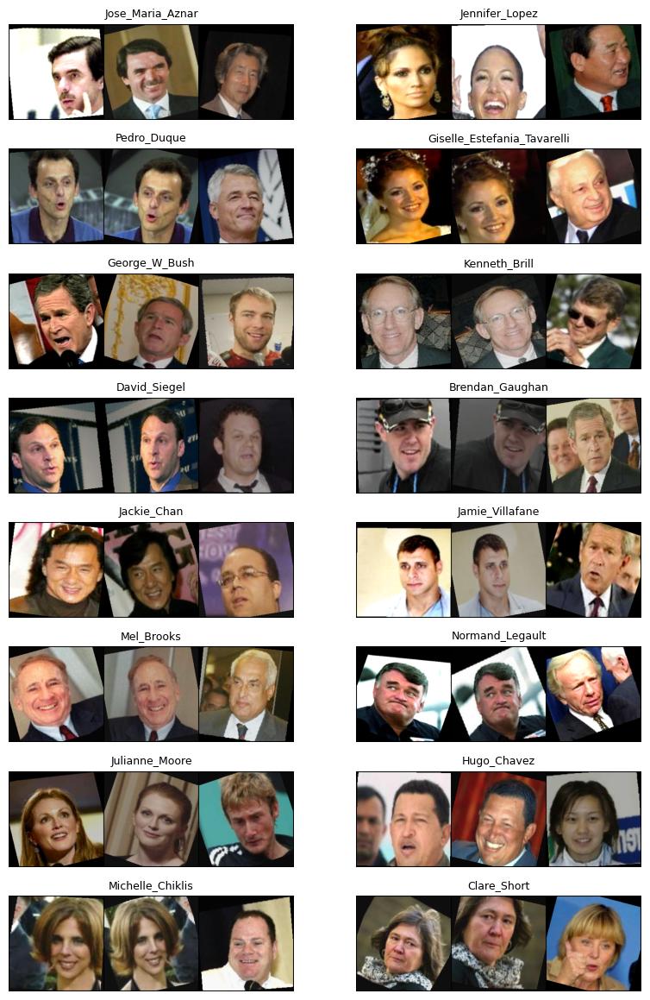

In [28]:
config.set_config_exp(path_dir_exp_lfw_trinet)

splits = ["test", "validation", "training", "training"]
uses_unnormalize = [True, True, True, False]

for split, use_unnormalize in zip(splits, uses_unnormalize):
    features, target = utils_data.sample(split=split, num_samples=16, use_unnormalize=use_unnormalize, use_labelset=True)
    values = list(features.values())
    features = torch.stack(tuple(tv.utils.make_grid([value[i] for value in values]) for i in range(len(values[0]))), dim=0)
    target = target["anchor"]

    path_save = path_dir_exp_lfw_trinet / "visualizations" / f"Sample_{split}{"" if use_unnormalize else "_normalized"}.png"
    visualize.visualize_images(features, labels=target, path_save=path_save)

## Models

### Adapted TriNet

In [36]:
config.set_config_exp(path_dir_exp_lfw_trinet)

model = factory.create_model()
print(model)

input_dummy = dict(anchor=torch.zeros(config.MODEL["shape_input"]), positive=torch.zeros(config.MODEL["shape_input"]), negative=torch.zeros(config.MODEL["shape_input"]))
print(torchinfo.summary(model, input_data=[input_dummy], verbose=0, col_names=("input_size", "output_size", "params_percent"), mode="eval"))

Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet/config.yaml
TriNetAdapted(
  (backbone): Sequential(
    (0): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
        (2): Hardswish()
      )
      (1): InvertedResidual(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=16, bias=False)
            (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
            (2): ReLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(16, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 16, kernel_size=(1, 1), stride=(1, 1

## Experiments

### Adapted TriNet on LFW

Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet/config.yaml
Trainer for experiment lfw_trinet
    Path: /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet
    Dataset (training): Dataset LFWTriplets
    Number of samples: 7620
    Path: /home/user/karacora/lab-vision-systems-assignments/assignment_7/data/lfwtriplets
    Split: training
    Transform of samples: Compose(
      PILToTensor()
      RandomResizedCrop(size=[224, 224], scale=[0.5, 1.0], ratio=[0.8, 1.2], interpolation=InterpolationMode.BILINEAR, antialias=True)
      RandomHorizontalFlip(p=0.5)
      RandomRotation(degrees=[-20.0, 20.0], interpolation=InterpolationMode.NEAREST, expand=False, fill=0)
      ToDtype(
    scale=True
    (transform_tv): ToDtype(scale=True)
  )
      ColorJitter(brightness=(0.75, 1.333), contrast=(0.8, 1.2), saturation=(0.8, 1.2))
      Normalize(mean=[0.4614, 0.3953, 0.348], std=[0.2861, 0.2614, 0.2568],

Validating: Epoch 000 | Batch 005 | LR 0.000167 | Loss 0.20000: 100%|██████████| 8/8 [00:02<00:00,  3.72it/s]
Training: Epoch 001 | Batch 060 | LR 0.000167 | Loss 0.12596: 100%|██████████| 60/60 [00:23<00:00,  2.52it/s]
Validating: Epoch 001 | Batch 005 | LR 0.000167 | Loss 0.20000: 100%|██████████| 8/8 [00:02<00:00,  3.97it/s]
Training: Epoch 002 | Batch 060 | LR 0.000233 | Loss 0.12040: 100%|██████████| 60/60 [00:23<00:00,  2.54it/s]
Validating: Epoch 002 | Batch 005 | LR 0.000233 | Loss 0.20000: 100%|██████████| 8/8 [00:02<00:00,  4.00it/s]
Training: Epoch 003 | Batch 060 | LR 0.000300 | Loss 0.10598: 100%|██████████| 60/60 [00:25<00:00,  2.39it/s]
Validating: Epoch 003 | Batch 005 | LR 0.000300 | Loss 0.20000: 100%|██████████| 8/8 [00:02<00:00,  3.95it/s]
Training: Epoch 004 | Batch 060 | LR 0.000367 | Loss 0.09423: 100%|██████████| 60/60 [00:25<00:00,  2.31it/s]
Validating: Epoch 004 | Batch 005 | LR 0.000367 | Loss 0.20000: 100%|██████████| 8/8 [00:02<00:00,  3.95it/s]
Training: 

Looping finished


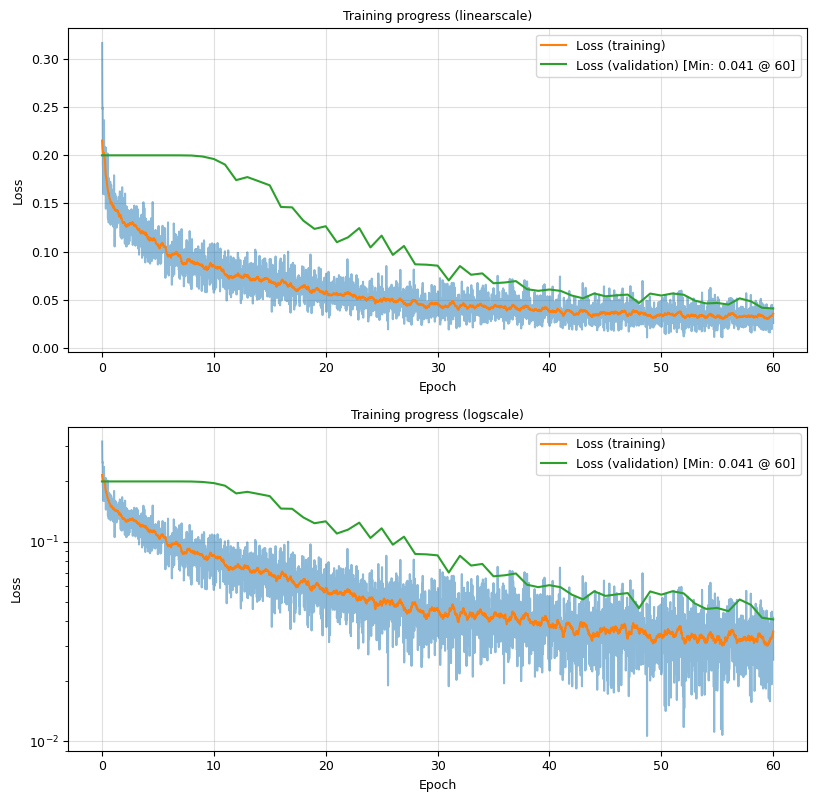

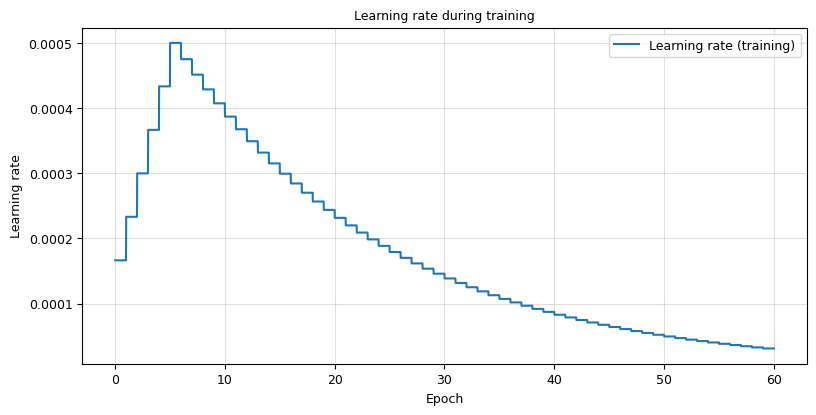

In [14]:
config.set_config_exp(path_dir_exp_lfw_trinet)

trainer = Trainer(name_exp_lfw_trinet)
trainer.loop(config.TRAINING["num_epochs"])

log = trainer.log
path_plots = path_dir_exp_lfw_trinet / "plots"
plot.plot_loss(log, path_save=path_plots / "Loss.png")
plot.plot_metrics(log, path_plots=path_plots)
plot.plot_learning_rate(log, path_save=path_plots / "Learning_rate.png")

In [5]:
config.set_config_exp(path_dir_exp_lfw_trinet)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

dataset, dataloader = factory.create_dataset_and_dataloader(split="test")

num_clusters = 10
counts_labels = torch.bincount(dataset.targets, minlength=len(dataset.labelset))
topk = torch.topk(counts_labels, num_clusters)

targets_topk = topk.indices
indices_topk = dataset.indices[torch.isin(dataset.targets, targets_topk)]
list_features, list_targets = utils_data.sample_dataset(dataset, indices_topk)

model = utils_checkpoints.load_model(path_dir_exp_lfw_trinet / "checkpoints" / "best.pth")
model = model.to(device)

featuress_anchor = []
latents_anchor = []
targets_anchor = []
with torch.no_grad():
    for features, targets in zip(list_features, list_targets):
        features_anchor = features["anchor"][None, ...]
        target_anchor = torch.as_tensor(targets["anchor"])[None, ...]

        featuress_anchor += [features_anchor]
        targets_anchor += [target_anchor]

        features_anchor = features_anchor.to(device)
        latent_anchor = model.forward_single(features_anchor)
        latents_anchor += [latent_anchor.cpu()]

featuress_anchor_flat = np.concatenate([features_anchor.flatten(1) for features_anchor in featuress_anchor])
featuress_anchor = np.concatenate([utils_data.unnormalize(features_anchor) for features_anchor in featuress_anchor])
targets_anchor = np.concatenate(targets_anchor)
latents_anchor = np.concatenate(latents_anchor)

Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet/config.yaml


In [6]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

labels_kmeans_features = KMeans(n_clusters=num_clusters).fit_predict(featuress_anchor_flat)
labels_kmeans_latents = KMeans(n_clusters=num_clusters).fit_predict(latents_anchor)

ari_imgs = adjusted_rand_score(targets_anchor, labels_kmeans_features)
ari_embs = adjusted_rand_score(targets_anchor, labels_kmeans_latents)

print(f"Clustering images achieves  ARI={round(ari_imgs*100,2)}%")
print(f"Clustering embeddings achieves ARI={round(ari_embs*100,2)}%")

print(f"Compression ratio: {latents_anchor.shape[-1]}/{featuress_anchor_flat.shape[-1]}  = {round(latents_anchor.shape[-1]/featuress_anchor_flat.shape[-1] * 100, 2)}%")

Clustering images achieves  ARI=2.97%
Clustering embeddings achieves ARI=31.85%
Compression ratio: 128/150528  = 0.09%


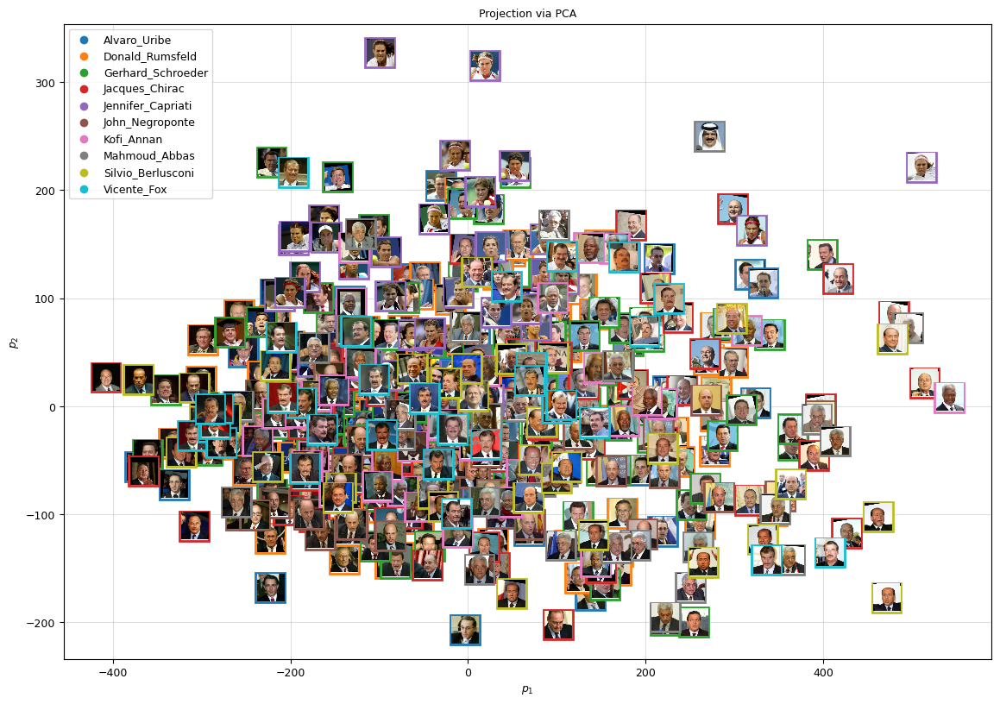

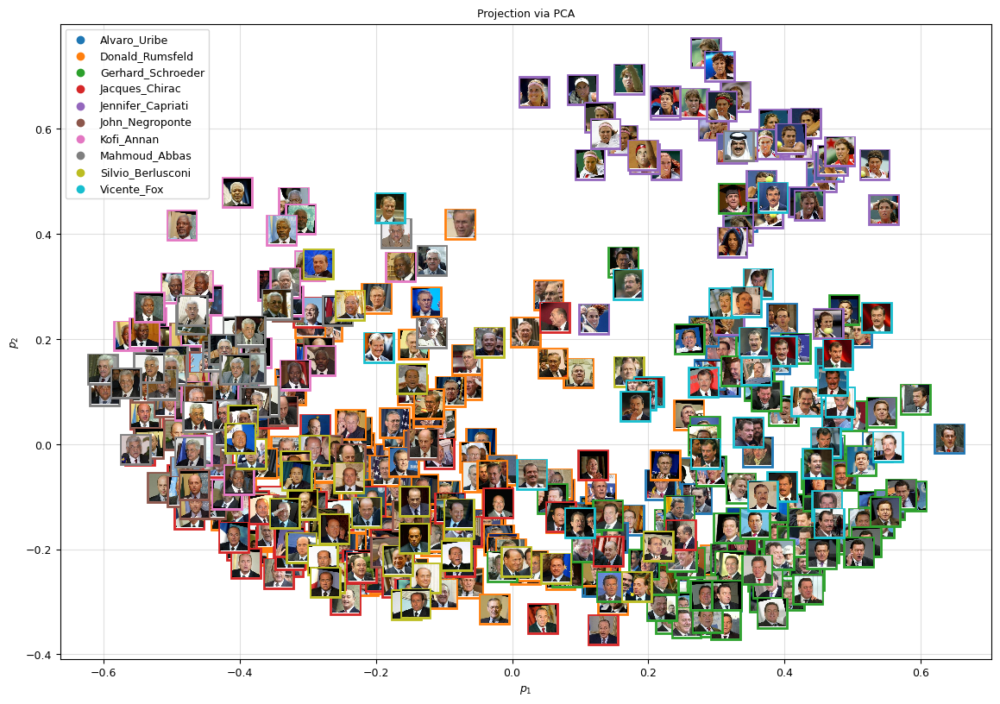

OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

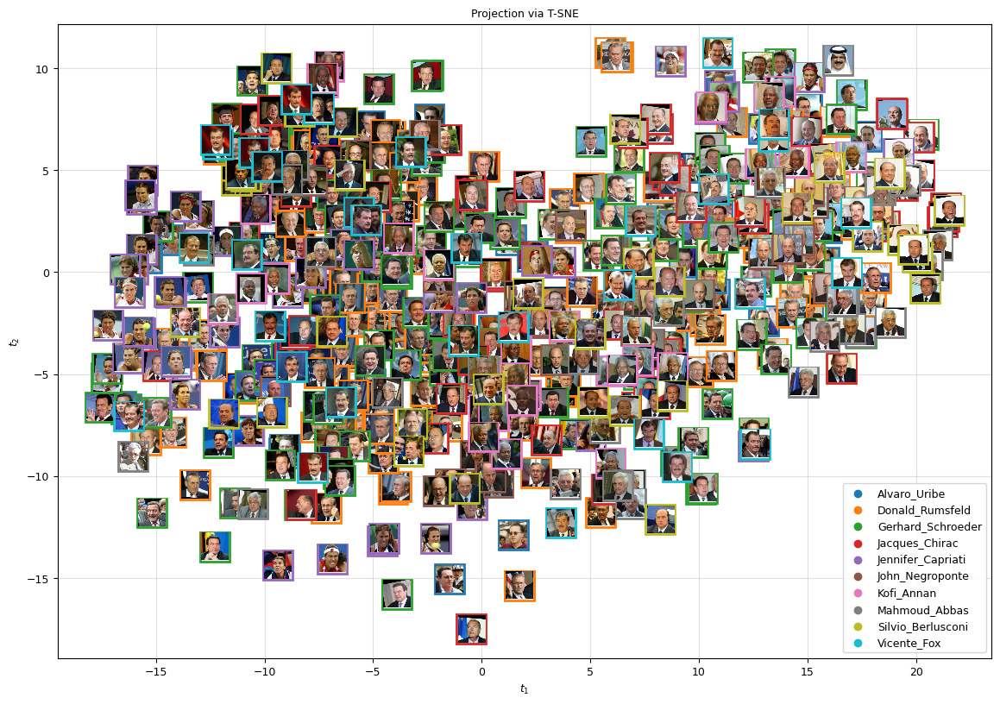

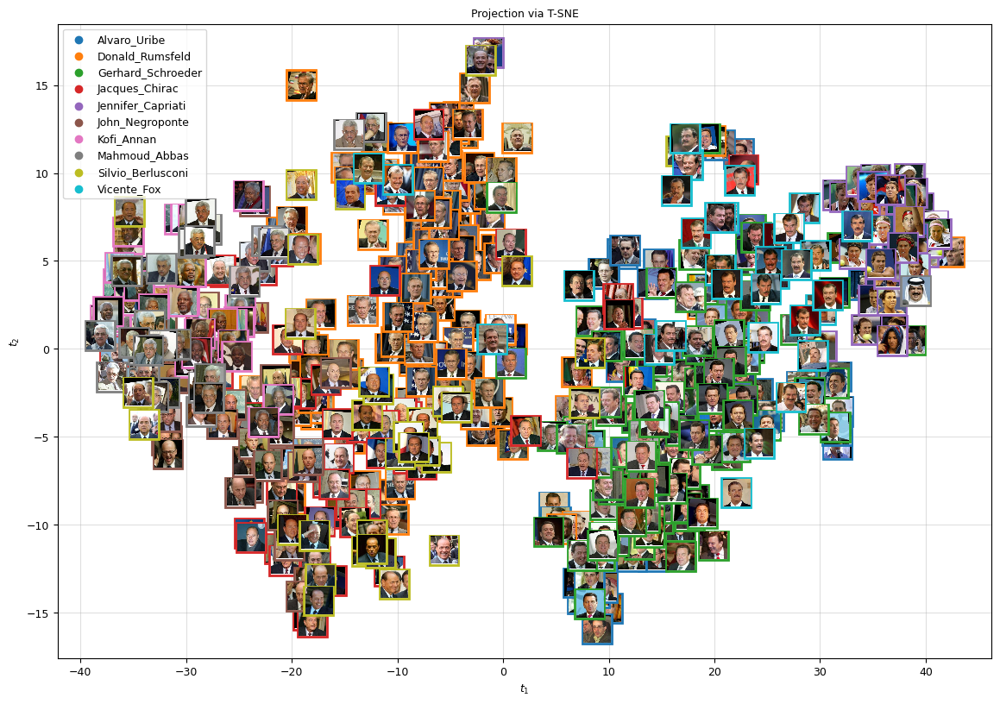

In [10]:
path_save = path_dir_exp_lfw_trinet / "plots" / "Projection_pca_samples.png"
plot.plot_projection_pca(featuress_anchor_flat, num_points=1000, targets=targets_anchor, labelset=dataset.labelset, images_annotation=featuress_anchor, zoom_annotation=0.1, path_save=path_save)

path_save = path_dir_exp_lfw_trinet / "plots" / "Projection_pca_latent.png"
plot.plot_projection_pca(latents_anchor, num_points=1000, targets=targets_anchor, labelset=dataset.labelset, images_annotation=featuress_anchor, zoom_annotation=0.1, path_save=path_save)

path_save = path_dir_exp_lfw_trinet / "plots" / "Projection_tsne_samples.png"
plot.plot_projection_tsne(featuress_anchor_flat, num_points=1000, targets=targets_anchor, labelset=dataset.labelset, images_annotation=featuress_anchor, zoom_annotation=0.1, path_save=path_save)

path_save = path_dir_exp_lfw_trinet / "plots" / "Projection_tsne_latent.png"
plot.plot_projection_tsne(latents_anchor, num_points=1000, targets=targets_anchor, labelset=dataset.labelset, images_annotation=featuress_anchor, zoom_annotation=0.1, path_save=path_save)

### Pretrained TriNet on LFW

Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet_pretrained/config.yaml
Trainer for experiment lfw_trinet_pretrained
    Path: /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet_pretrained
    Dataset (training): Dataset LFWTriplets
    Number of samples: 7620
    Path: /home/user/karacora/lab-vision-systems-assignments/assignment_7/data/lfwtriplets
    Split: training
    Transform of samples: Compose(
      PILToTensor()
      RandomResizedCrop(size=[224, 224], scale=[0.4, 1.0], ratio=[0.8, 1.2], interpolation=InterpolationMode.BILINEAR, antialias=True)
      RandomHorizontalFlip(p=0.5)
      RandomRotation(degrees=[-20.0, 20.0], interpolation=InterpolationMode.NEAREST, expand=False, fill=0)
      ToDtype(
    scale=True
    (transform_tv): ToDtype(scale=True)
  )
      ColorJitter(brightness=(0.75, 1.333), contrast=(0.8, 1.2), saturation=(0.8, 1.2))
      Normalize(mean=[0.4614, 0.3953, 0.34

Validating: Epoch 000 | Batch 005 | LR 0.000033 | Loss 0.14629: 100%|██████████| 8/8 [00:02<00:00,  3.80it/s]
Training: Epoch 001 | Batch 060 | LR 0.000033 | Loss 0.08135: 100%|██████████| 60/60 [00:22<00:00,  2.70it/s]
Validating: Epoch 001 | Batch 005 | LR 0.000033 | Loss 0.12649: 100%|██████████| 8/8 [00:02<00:00,  3.83it/s]
Training: Epoch 002 | Batch 060 | LR 0.000047 | Loss 0.09389: 100%|██████████| 60/60 [00:22<00:00,  2.70it/s]
Validating: Epoch 002 | Batch 005 | LR 0.000047 | Loss 0.11434: 100%|██████████| 8/8 [00:02<00:00,  3.79it/s]
Training: Epoch 003 | Batch 060 | LR 0.000060 | Loss 0.07790: 100%|██████████| 60/60 [00:22<00:00,  2.73it/s]
Validating: Epoch 003 | Batch 005 | LR 0.000060 | Loss 0.07411: 100%|██████████| 8/8 [00:02<00:00,  3.77it/s]
Training: Epoch 004 | Batch 060 | LR 0.000073 | Loss 0.06082: 100%|██████████| 60/60 [00:22<00:00,  2.72it/s]
Validating: Epoch 004 | Batch 005 | LR 0.000073 | Loss 0.06692: 100%|██████████| 8/8 [00:02<00:00,  3.81it/s]
Training: 

Looping finished


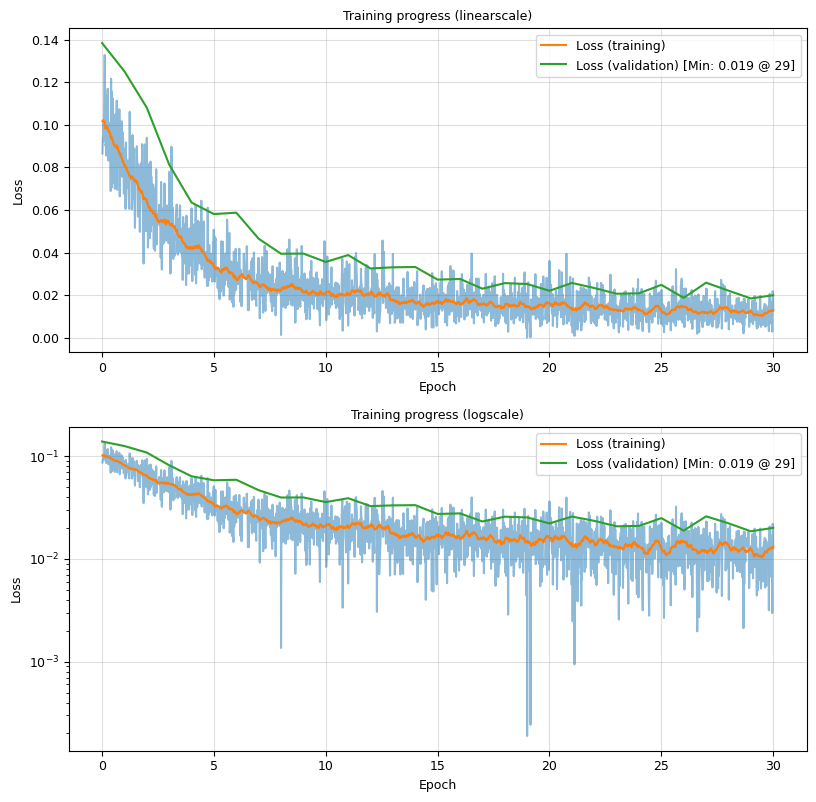

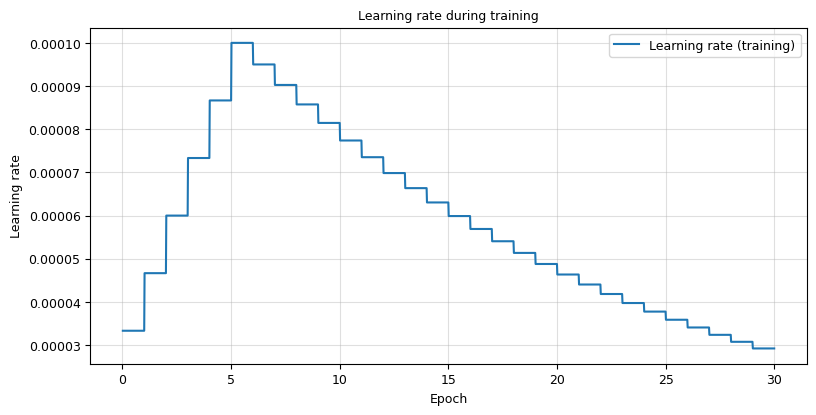

In [30]:
config.set_config_exp(path_dir_exp_lfw_trinet_pretrained)

trainer = Trainer(name_exp_lfw_trinet_pretrained)
trainer.loop(config.TRAINING["num_epochs"])

log = trainer.log
path_plots = path_dir_exp_lfw_trinet_pretrained / "plots"
plot.plot_loss(log, path_save=path_plots / "Loss.png")
plot.plot_metrics(log, path_plots=path_plots)
plot.plot_learning_rate(log, path_save=path_plots / "Learning_rate.png")

In [11]:
config.set_config_exp(path_dir_exp_lfw_trinet_pretrained)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

dataset, dataloader = factory.create_dataset_and_dataloader(split="test")

num_clusters = 10
counts_labels = torch.bincount(dataset.targets, minlength=len(dataset.labelset))
topk = torch.topk(counts_labels, num_clusters)

targets_topk = topk.indices
indices_topk = dataset.indices[torch.isin(dataset.targets, targets_topk)]
list_features, list_targets = utils_data.sample_dataset(dataset, indices_topk)

model = utils_checkpoints.load_model(path_dir_exp_lfw_trinet_pretrained / "checkpoints" / "best.pth")
model = model.to(device)

featuress_anchor = []
latents_anchor = []
targets_anchor = []
with torch.no_grad():
    for features, targets in zip(list_features, list_targets):
        features_anchor = features["anchor"][None, ...]
        target_anchor = torch.as_tensor(targets["anchor"])[None, ...]

        featuress_anchor += [features_anchor]
        targets_anchor += [target_anchor]

        features_anchor = features_anchor.to(device)
        latent_anchor = model.forward_single(features_anchor)
        latents_anchor += [latent_anchor.cpu()]

featuress_anchor_flat = np.concatenate([features_anchor.flatten(1) for features_anchor in featuress_anchor])
featuress_anchor = np.concatenate([utils_data.unnormalize(features_anchor) for features_anchor in featuress_anchor])
targets_anchor = np.concatenate(targets_anchor)
latents_anchor = np.concatenate(latents_anchor)

Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet_pretrained/config.yaml


In [12]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

labels_kmeans_features = KMeans(n_clusters=num_clusters).fit_predict(featuress_anchor_flat)
labels_kmeans_latents = KMeans(n_clusters=num_clusters).fit_predict(latents_anchor)

ari_imgs = adjusted_rand_score(targets_anchor, labels_kmeans_features)
ari_embs = adjusted_rand_score(targets_anchor, labels_kmeans_latents)

print(f"Clustering images achieves  ARI={round(ari_imgs*100,2)}%")
print(f"Clustering embeddings achieves ARI={round(ari_embs*100,2)}%")

print(f"Compression ratio: {latents_anchor.shape[-1]}/{featuress_anchor_flat.shape[-1]}  = {round(latents_anchor.shape[-1]/featuress_anchor_flat.shape[-1] * 100, 2)}%")

Clustering images achieves  ARI=1.79%
Clustering embeddings achieves ARI=51.92%
Compression ratio: 128/150528  = 0.09%


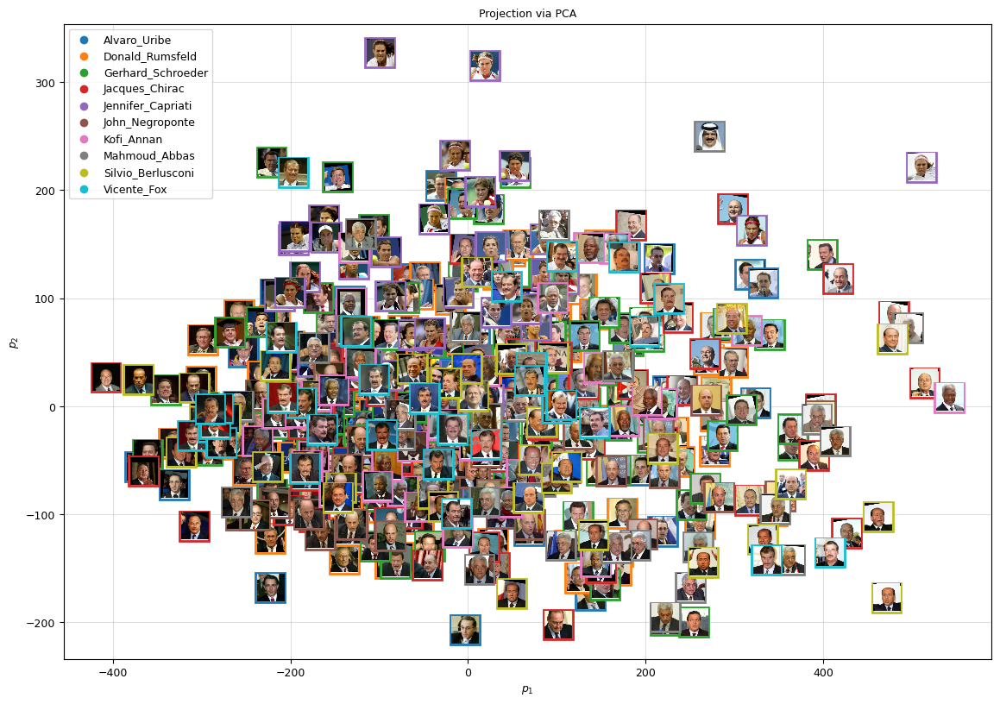

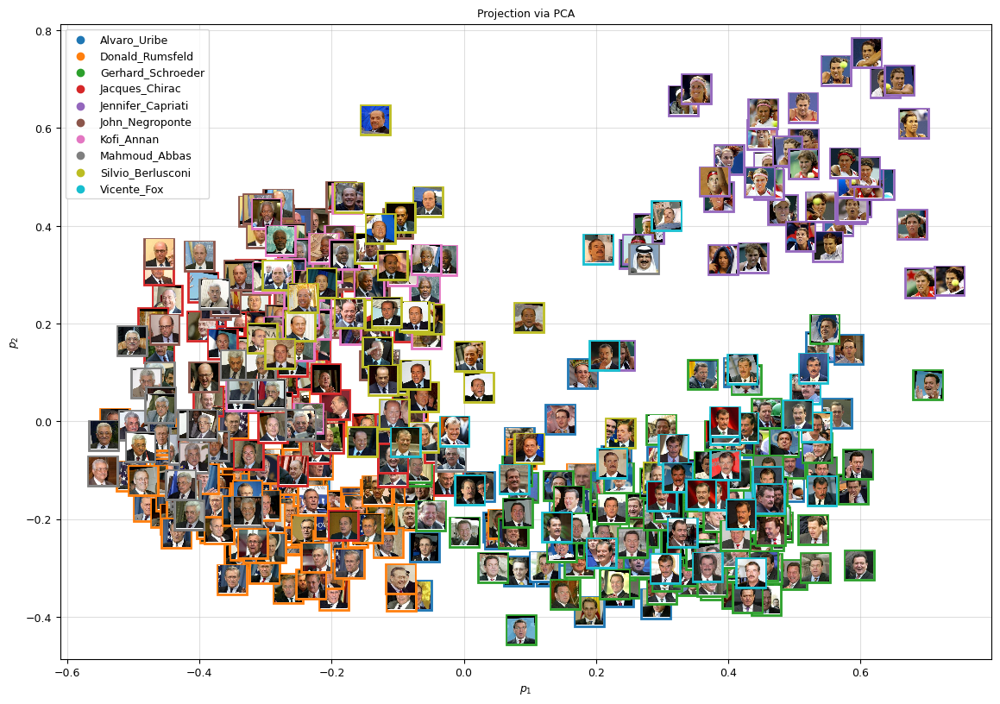

OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

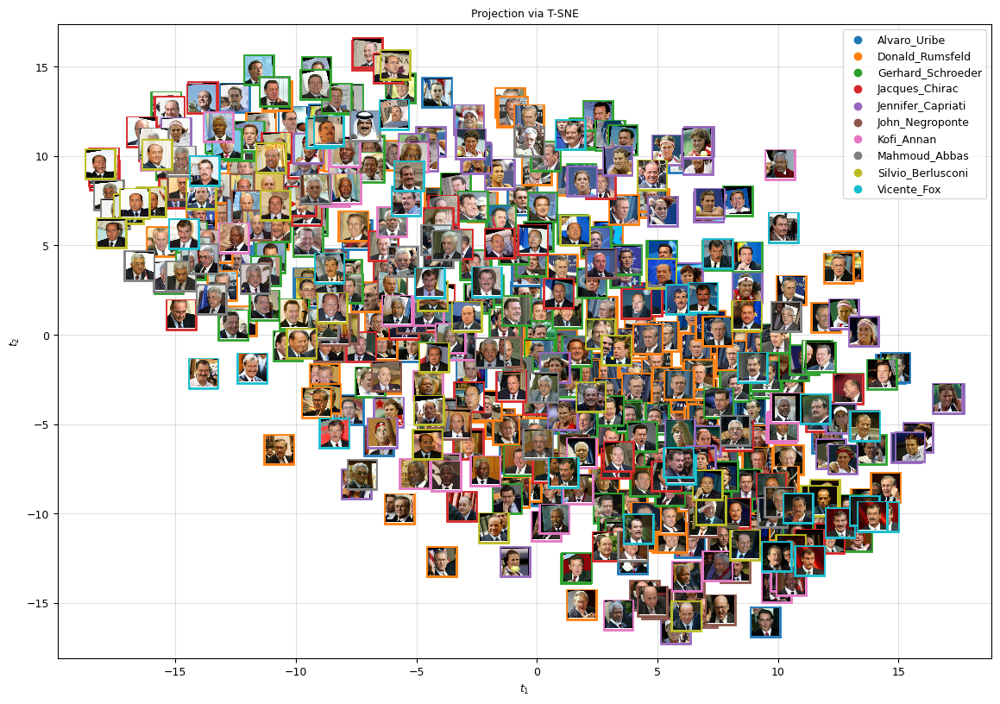

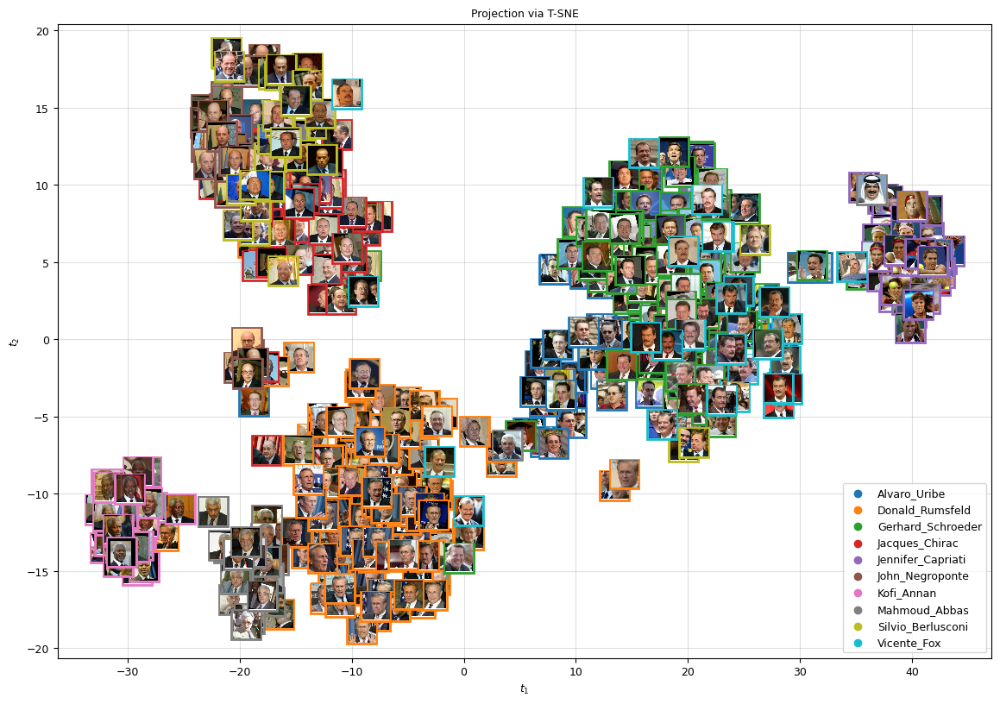

In [13]:
path_save = path_dir_exp_lfw_trinet_pretrained / "plots" / "Projection_pca_samples.png"
plot.plot_projection_pca(featuress_anchor_flat, num_points=1000, targets=targets_anchor, labelset=dataset.labelset, images_annotation=featuress_anchor, zoom_annotation=0.1, path_save=path_save)

path_save = path_dir_exp_lfw_trinet_pretrained / "plots" / "Projection_pca_latent.png"
plot.plot_projection_pca(latents_anchor, num_points=1000, targets=targets_anchor, labelset=dataset.labelset, images_annotation=featuress_anchor, zoom_annotation=0.1, path_save=path_save)

path_save = path_dir_exp_lfw_trinet_pretrained / "plots" / "Projection_tsne_samples.png"
plot.plot_projection_tsne(featuress_anchor_flat, num_points=1000, targets=targets_anchor, labelset=dataset.labelset, images_annotation=featuress_anchor, zoom_annotation=0.1, path_save=path_save)

path_save = path_dir_exp_lfw_trinet_pretrained / "plots" / "Projection_tsne_latent.png"
plot.plot_projection_tsne(latents_anchor, num_points=1000, targets=targets_anchor, labelset=dataset.labelset, images_annotation=featuress_anchor, zoom_annotation=0.1, path_save=path_save)

### Pretrained TriNet on LFW with semi-hard negative mining

Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet_pretrained_shnmining/config.yaml
Trainer for experiment lfw_trinet_pretrained_shnmining
    Path: /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet_pretrained_shnmining
    Dataset (training): Dataset LFWTriplets
    Number of samples: 7620
    Path: /home/user/karacora/lab-vision-systems-assignments/assignment_7/data/lfwtriplets
    Split: training
    Transform of samples: Compose(
      PILToTensor()
      RandomResizedCrop(size=[224, 224], scale=[0.4, 1.0], ratio=[0.8, 1.2], interpolation=InterpolationMode.BILINEAR, antialias=True)
      RandomHorizontalFlip(p=0.5)
      RandomRotation(degrees=[-20.0, 20.0], interpolation=InterpolationMode.NEAREST, expand=False, fill=0)
      ToDtype(
    scale=True
    (transform_tv): ToDtype(scale=True)
  )
      ColorJitter(brightness=(0.75, 1.333), contrast=(0.8, 1.2), saturation=(0.8, 1.2))
      Normal

Validating: Epoch 000 | Batch 005 | LR 0.000100 | Loss 0.18987: 100%|██████████| 8/8 [00:02<00:00,  3.97it/s]
Training: Epoch 001 | Batch 060 | LR 0.000100 | Loss 0.16879: 100%|██████████| 60/60 [00:22<00:00,  2.65it/s]
Validating: Epoch 001 | Batch 005 | LR 0.000100 | Loss 0.20734: 100%|██████████| 8/8 [00:02<00:00,  3.73it/s]
Training: Epoch 002 | Batch 060 | LR 0.000140 | Loss 0.14104: 100%|██████████| 60/60 [00:22<00:00,  2.72it/s]
Validating: Epoch 002 | Batch 005 | LR 0.000140 | Loss 0.15249: 100%|██████████| 8/8 [00:01<00:00,  4.01it/s]
Training: Epoch 003 | Batch 060 | LR 0.000180 | Loss 0.12336: 100%|██████████| 60/60 [00:21<00:00,  2.73it/s]
Validating: Epoch 003 | Batch 005 | LR 0.000180 | Loss 0.15767: 100%|██████████| 8/8 [00:01<00:00,  4.05it/s]
Training: Epoch 004 | Batch 060 | LR 0.000220 | Loss 0.09215: 100%|██████████| 60/60 [00:22<00:00,  2.70it/s]
Validating: Epoch 004 | Batch 005 | LR 0.000220 | Loss 0.14048: 100%|██████████| 8/8 [00:01<00:00,  4.03it/s]
Training: 

Looping finished


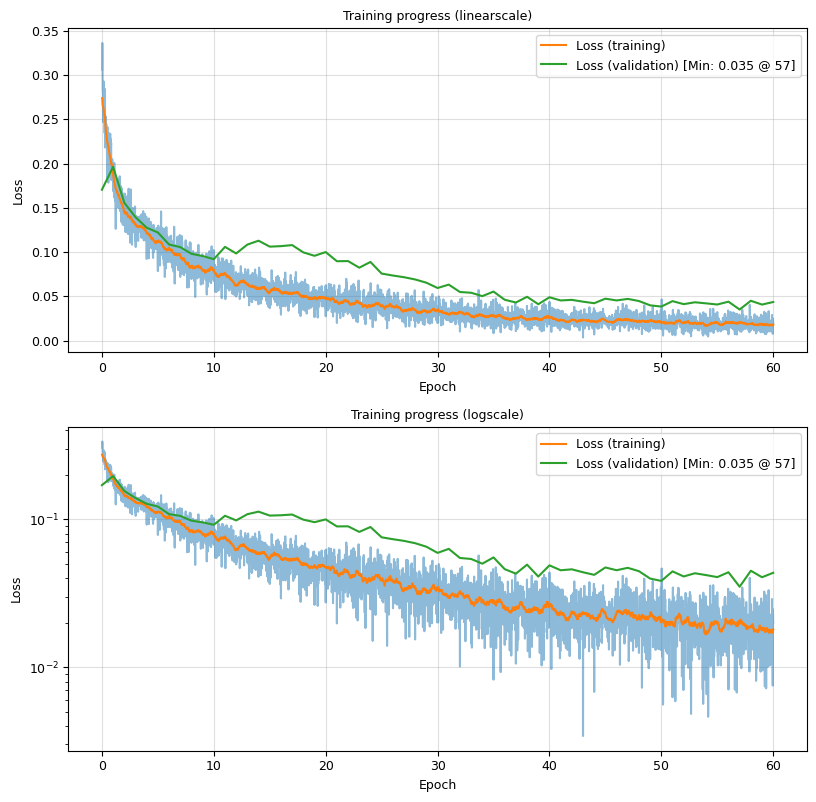

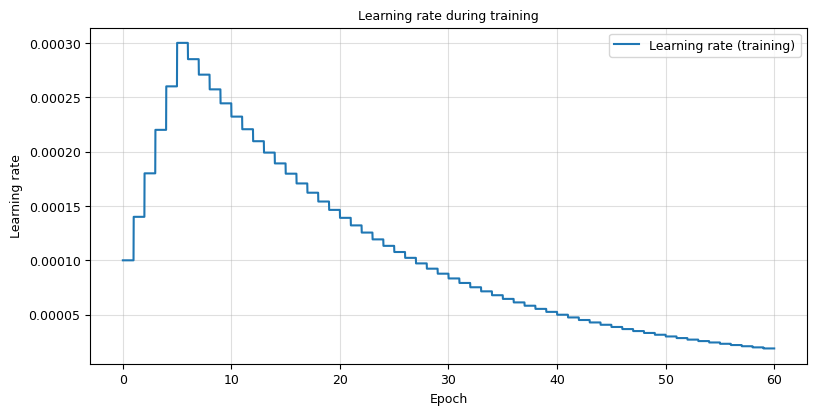

In [9]:
config.set_config_exp(path_dir_exp_lfw_trinet_pretrained_shnmining)

trainer = Trainer(name_exp_lfw_trinet_pretrained_shnmining)
trainer.loop(config.TRAINING["num_epochs"])

log = trainer.log
path_plots = path_dir_exp_lfw_trinet_pretrained_shnmining / "plots"
plot.plot_loss(log, path_save=path_plots / "Loss.png")
plot.plot_metrics(log, path_plots=path_plots)
plot.plot_learning_rate(log, path_save=path_plots / "Learning_rate.png")

In [10]:
config.set_config_exp(path_dir_exp_lfw_trinet_pretrained_shnmining)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

dataset, dataloader = factory.create_dataset_and_dataloader(split="test")

counts_labels = torch.bincount(dataset.targets, minlength=len(dataset.labelset))
topk = torch.topk(counts_labels, 10)

targets_topk = topk.indices
indices_topk = dataset.indices[torch.isin(dataset.targets, targets_topk)]
list_features, list_targets = utils_data.sample_dataset(dataset, indices_topk)

model = utils_checkpoints.load_model(path_dir_exp_lfw_trinet_pretrained_shnmining / "checkpoints" / "best.pth")
model = model.to(device)

featuress_anchor = []
latents_anchor = []
targets_anchor = []
with torch.no_grad():
    for features, targets in zip(list_features, list_targets):
        features_anchor = features["anchor"][None, ...]
        target_anchor = torch.as_tensor(targets["anchor"])[None, ...]

        featuress_anchor += [features_anchor]
        targets_anchor += [target_anchor]

        features_anchor = features_anchor.to(device)
        latent_anchor = model.forward_single(features_anchor)
        latents_anchor += [latent_anchor.cpu()]

featuress_anchor_flat = np.concatenate([features_anchor.flatten(1) for features_anchor in featuress_anchor])
featuress_anchor = np.concatenate([utils_data.unnormalize(features_anchor) for features_anchor in featuress_anchor])
targets_anchor = np.concatenate(targets_anchor)
latents_anchor = np.concatenate(latents_anchor)

Config loaded from /home/user/karacora/lab-vision-systems-assignments/assignment_7/experiments/lfw_trinet_pretrained_shnmining/config.yaml


In [11]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

labels_kmeans_features = KMeans(n_clusters=10).fit_predict(featuress_anchor_flat)
labels_kmeans_latents = KMeans(n_clusters=10).fit_predict(latents_anchor)

ari_imgs = adjusted_rand_score(targets_anchor, labels_kmeans_features)
ari_embs = adjusted_rand_score(targets_anchor, labels_kmeans_latents)

print(f"Clustering images achieves  ARI={round(ari_imgs*100,2)}%")
print(f"Clustering embeddings achieves ARI={round(ari_embs*100,2)}%")

print(f"Compression ratio: {latents_anchor.shape[-1]}/{featuress_anchor_flat.shape[-1]}  = {round(latents_anchor.shape[-1]/featuress_anchor_flat.shape[-1] * 100, 2)}%")

Clustering images achieves  ARI=2.45%
Clustering embeddings achieves ARI=66.59%
Compression ratio: 128/150528  = 0.09%


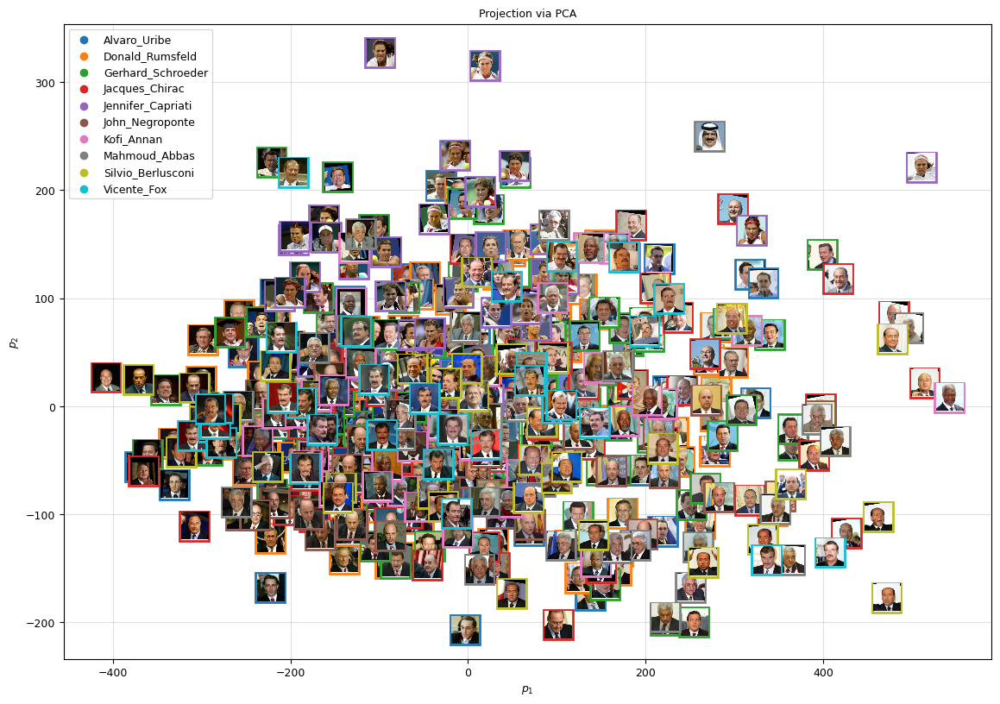

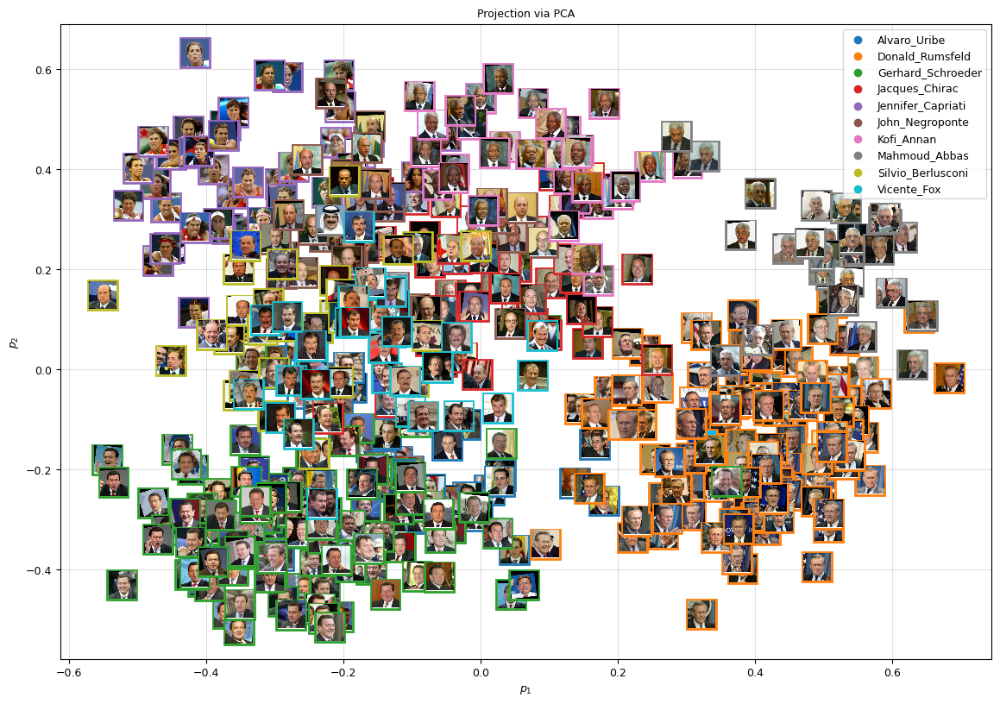

OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detect OpenMP Loop and this application may hang. Please rebuild the library with USE_OPENMP=1 option.
OpenBLAS Warning : Detec

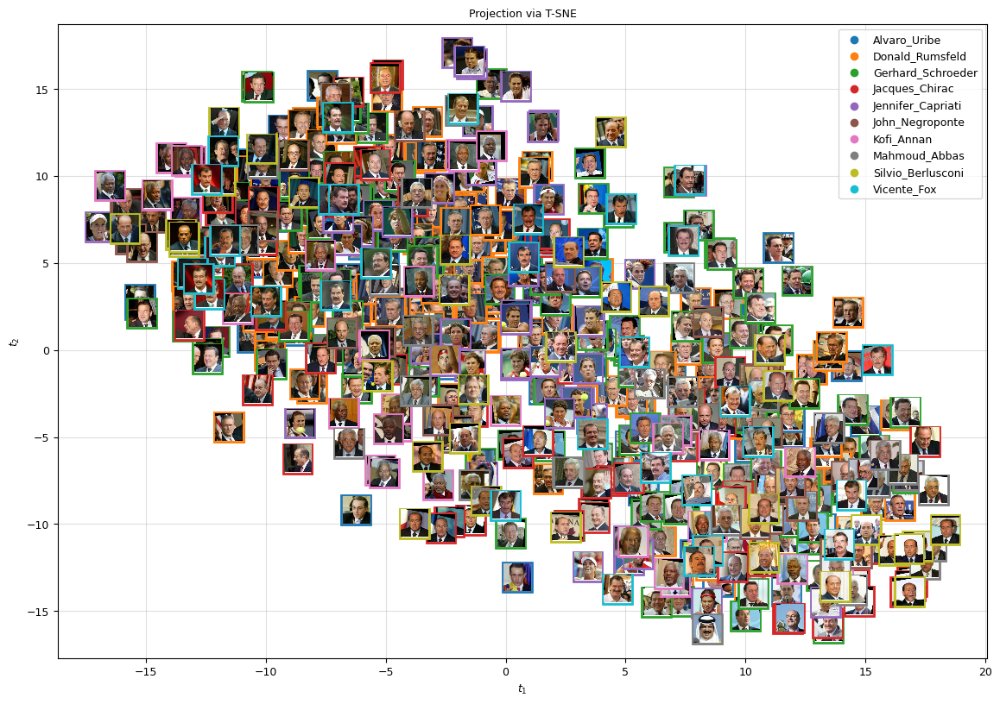

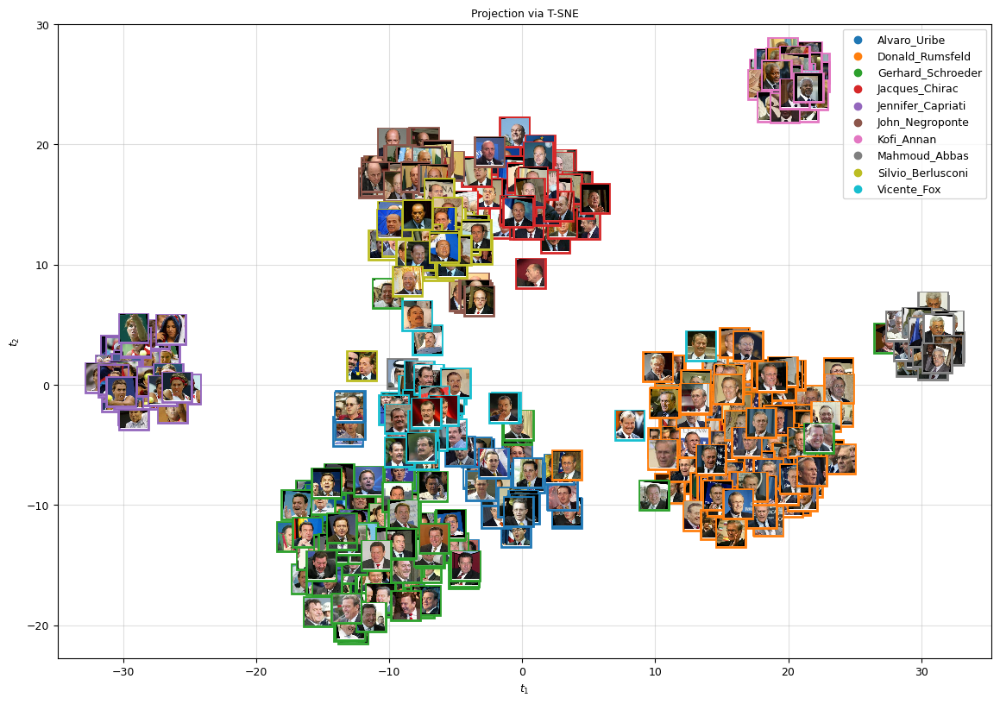

In [12]:
path_save = path_dir_exp_lfw_trinet_pretrained_shnmining / "plots" / "Projection_pca_samples.png"
plot.plot_projection_pca(featuress_anchor_flat, num_points=1000, targets=targets_anchor, labelset=dataset.labelset, images_annotation=featuress_anchor, zoom_annotation=0.1, path_save=path_save)

path_save = path_dir_exp_lfw_trinet_pretrained_shnmining / "plots" / "Projection_pca_latent.png"
plot.plot_projection_pca(latents_anchor, num_points=1000, targets=targets_anchor, labelset=dataset.labelset, images_annotation=featuress_anchor, zoom_annotation=0.1, path_save=path_save)

path_save = path_dir_exp_lfw_trinet_pretrained_shnmining / "plots" / "Projection_tsne_samples.png"
plot.plot_projection_tsne(featuress_anchor_flat, num_points=1000, targets=targets_anchor, labelset=dataset.labelset, images_annotation=featuress_anchor, zoom_annotation=0.1, path_save=path_save)

path_save = path_dir_exp_lfw_trinet_pretrained_shnmining / "plots" / "Projection_tsne_latent.png"
plot.plot_projection_tsne(latents_anchor, num_points=1000, targets=targets_anchor, labelset=dataset.labelset, images_annotation=featuress_anchor, zoom_annotation=0.1, path_save=path_save)